# Analyzing Customer Purchasing Patterns with Market Basket

Retail stores rely on understanding customer purchasing patterns to make informed decisions about inventory, pricing, and marketing strategies. Analyzing such patterns can reveal valuable insights into customer behavior and preferences, enabling businesses to make data-driven decisions. 

This project focuses on analyzing the customer purchasing patterns of a retail store using a dataset obtained from "Customer Purchasing Patterns with Market Basket" on Kaggle.com. 

Through this analysis, we aim to identify trends and patterns that can assist the retail store in improving its operations and enhancing customer satisfaction.

In [1]:
import pandas as pd
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori, association_rules
from mlxtend.frequent_patterns import fpgrowth
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from collections import Counter

The original dataset was structured such that each row represented a transaction, and the items purchased were listed in columns, as shown below.

In [2]:
data = pd.read_csv('prepared_dataset.csv')
data.head(10)

,Unnamed: 0,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,0,Logitech M510 Wireless mouse,HP 63 Ink,HP 65 ink,nonda USB C to USB Adapter,10ft iPHone Charger Cable,HP 902XL ink,Creative Pebble 2.0 Speakers,Cleaning Gel Universal Dust Cleaner,Micro Center 32GB Memory card,YUNSONG 3pack 6ft Nylon Lightning Cable,TopMate C5 Laptop Cooler pad,Apple USB-C Charger cable,HyperX Cloud Stinger Headset,TONOR USB Gaming Microphone,Dust-Off Compressed Gas 2 pack,3A USB Type C Cable 3 pack 6FT,HOVAMP iPhone charger,SanDisk Ultra 128GB card,FEEL2NICE 5 pack 10ft Lighning cable,FEIYOLD Blue light Blocking Glasses
1,1,Apple Lightning to Digital AV Adapter,TP-Link AC1750 Smart WiFi Router,Apple Pencil,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,UNEN Mfi Certified 5-pack Lightning Cable,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,Cat8 Ethernet Cable,HP 65 ink,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,Dust-Off Compressed Gas 2 pack,Screen Mom Screen Cleaner kit,Moread HDMI to VGA Adapter,HP 62XL Tri-Color ink,Apple USB-C Charger cable,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,5,TopMate C5 Laptop Cooler pad,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,6,Anker 2-in-1 USB Card Reader,USB 2.0 Printer cable,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,7,10ft iPHone Charger Cable 2 Pack,Apple Lightning to USB cable,HP952XL ink,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,8,Nylon Braided Lightning to USB cable,VIVO Dual LCD Monitor Desk mount,Apple USB-C Charger cable,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,9,USB 2.0 Printer cable,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


To prepare the data for analysis, we will be concatenating all items in each transaction row into a single list in a column. The code for this transformation is displayed below.

In [3]:
data2 = data.apply(lambda x: ','.join(x[['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10',
       '11', '12', '13', '14', '15', '16', '17', '18', '19']].dropna()), axis=1)
data2 = pd.DataFrame(data2)
data2 = data2.reset_index()
data2 = data2.rename(columns={data2.columns[0]:'tid', data2.columns[1]:'basket'})
data2['basket'] = data2['basket'].str.split(',')

After preprocessing the data, the resulting table is presented below:

In [4]:
data2.head(10)

,tid,basket
0,0,"[Logitech M510 Wireless mouse, HP 63 Ink, HP 6..."
1,1,"[Apple Lightning to Digital AV Adapter, TP-Lin..."
2,2,[UNEN Mfi Certified 5-pack Lightning Cable]
3,3,"[Cat8 Ethernet Cable, HP 65 ink]"
4,4,"[Dust-Off Compressed Gas 2 pack, Screen Mom Sc..."
5,5,[TopMate C5 Laptop Cooler pad]
6,6,"[Anker 2-in-1 USB Card Reader, USB 2.0 Printer..."
7,7,"[10ft iPHone Charger Cable 2 Pack, Apple Light..."
8,8,"[Nylon Braided Lightning to USB cable, VIVO Du..."
9,9,[USB 2.0 Printer cable]


## Exploratory Data Analysis

The next step is to perform exploratory data analysis (EDA) to gain initial insights and understand the data better. EDA helps in identifying patterns, trends, and outliers in the data, which can guide the direction of further analysis.

### How many items each customer buy?

First, we will analyze the number of items in each transaction to determine the typical amount of items that customers purchase from the store. 

This can be achieved by counting the number of items in each transaction and creating a new column to store these counts.We can then use Matplotlib to create a histogram of the count column.

Here is an example line of code that can accomplish this:

In [5]:
data2['items_count'] = data2['basket'].apply(lambda x: len(x))

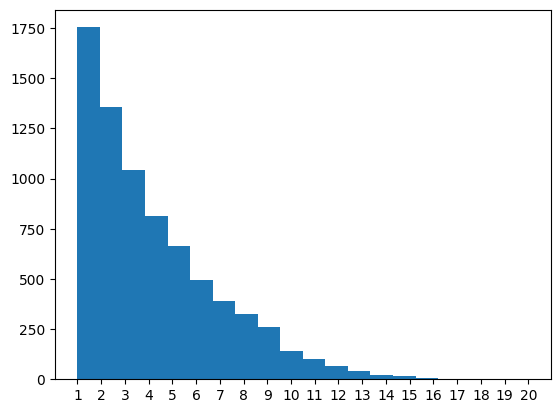

In [6]:
item_countlist = data2['items_count'].tolist()
plt.hist(item_countlist, bins=20)
plt.xticks(range(min(item_countlist), max(item_countlist)+1))
plt.show()

**Implications**

- Based on the histogram below, we can observe that the distribution is **highly skewed to the right.** 
- This indicates that the **majority of customers purchase only 1-2 items** from the store in each transaction.

### What are the most selling products?

Next, we can analyze the most frequently purchased products from the store. 

To achieve this, we can first concatenate all the item lists from the transactions into one unified list. Then, we can use the Python module collections and its Counter() function to count the occurrences of each item.

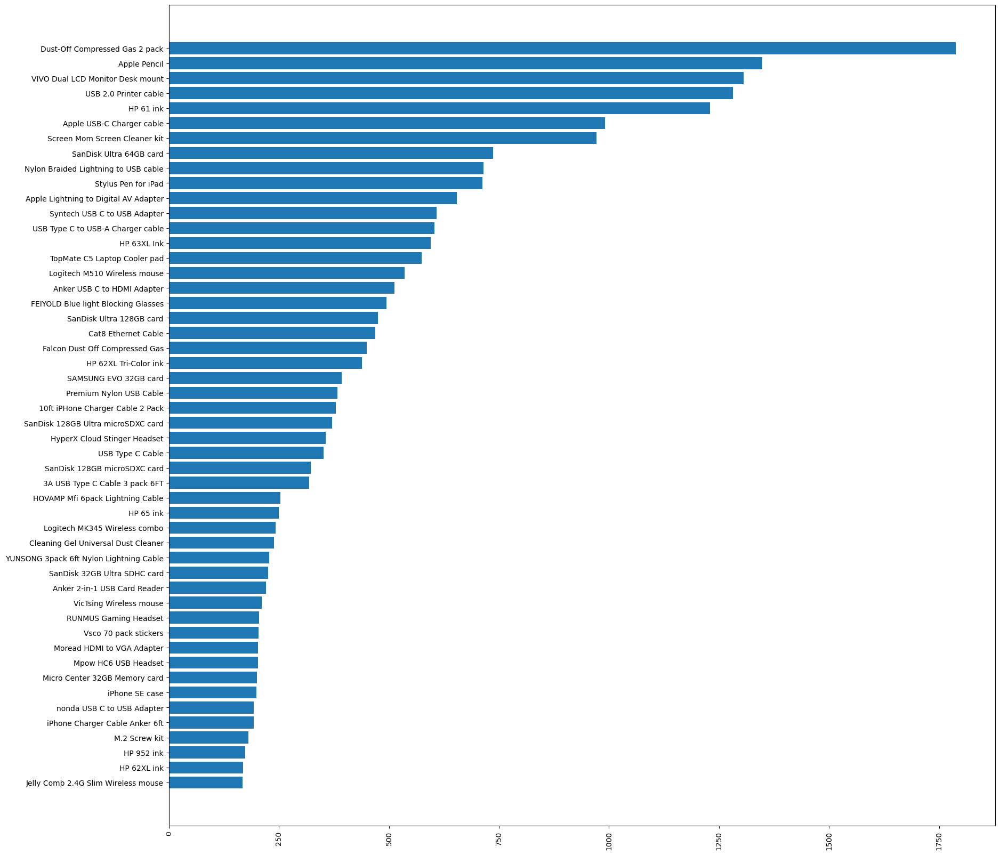

In [7]:
transactions = data2['basket'].tolist()
flatten = [item for sub in transactions for item in sub]
count = Counter(flatten)
counttable = pd.DataFrame(count.most_common(50), columns=['item', 'count'])

plt.figure(figsize=(20,20))
plt.barh(width='count', y='item', data=counttable.sort_values('count', ascending=False))
plt.gca().invert_yaxis()
plt.xticks(rotation=90)
plt.show()

**Implications**

- Our analysis show that the top 5 most frequently purchased products are:
    - Dust-off compressed Gas 2 pack
    - Apple pencil
    - VIVO dual LCD monitor desk mount
    - USB 2.0 printer cable
    - HP 61 ink

This information can be useful for the store to make strategic decisions regarding product placement, inventory management, and advertising campaigns. By ensuring that these top-selling products are displayed and well-stocked, the store can increase its sales and customer satisfaction. Additionally, the store may want to consider bundling or promoting these popular products with complementary items to increase their overall sales.

## Market Basket Analysis: Association rules

**Market basket** analysis is a powerful technique used to identify relationships between different products or items that customers frequently purchase together. It involves analyzing transactional data to identify the co-occurrence of items in a customer's basket

In simple term it often represented as **association rules** between items, where an **antecedent** represents a condition or pattern and a **consequent** represents an outcome or conclusion. For instance, if a customer buys **bread (antecedent)**, then they are likely to buy **milk (consequent)**

While there are certainly many combinations of item pairs that customers buy together, market basket analysis aims to identify groups of items that are statistically significant and meaningful for a business to utilize. 
Management teams can gain valuable insights into customer behavior and adjust their strategies accordingly to take advantage of these patterns.

**There are some Some Common statistical metrics used in market basket analysis include**
- **Support**
	- Measures the frequency of occurrence of a given itemset in the transactional data.
	- Higher supports means the item(s) are frequently appear in the transaction
- **Confidence**
	- Measures the conditional probability of one item being purchased given that another item is already in the basket.
	- Confidence ranges from 0 to 1, with higher values indicating stronger relationships between items.
- **Lift**
	- Which measures the strength of association between two items.
	- Lift values greater than 1 indicates a positive association, meaning that the presence of one item in a basket makes it more likely that the other item will also be in the basket and vice versa
- **Leverage**
	- Which quantifies how much the occurrence of two items together deviates from what would be expected if they were independent.
	- The range of leverage is from -1 to 1, with a value greater than 0 indicating a significant non-random relationship between the items in a basket.
- **Conviction**
	- which measures how much the antecedent of a rule implies the consequent.
	- The range of conviction is from 0 to infinity, with a value greater than 1 indicating that the antecedent and consequent are positively related and a value closer to 0 indicating that they are not related or negatively related.

The insights gained from market basket analysis can help businesses improve their sales and marketing strategies by identifying complementary products to bundle, optimizing product placement, and creating targeted promotions based on the identified relationships between items.

## Analysis Scope

To provide a clear focus for the analysis, it is helpful to define a specific scenario or problem that the market basket analysis aims to solve. This can ensure that the analysis is relevant and targeted towards specific business objectives, and can help to identify which data and metrics are most important for the analysis.

**Business Scenario**: "A retail store wants to increase its sales revenue by offering bundle sales for items that are frequently purchased together."

## One hot table

To prepare the transaction data for market basket analysis, we need to transform the transaction table into a **one-hot encoded table**, where each row represents a transaction, each column represents an item, and the value is a Boolean indicating whether the item was purchased in that transaction or not. This is a standard format for market basket analysis.

Here is an example code and preview table to perform this transformation:

In [8]:
encoder = TransactionEncoder().fit(transactions)
onehot = encoder.transform(transactions)
onehot = pd.DataFrame(onehot, columns = encoder.columns_)
onehot.iloc[:,:5].head(10)

,10ft iPHone Charger Cable,10ft iPHone Charger Cable 2 Pack,3 pack Nylon Braided Lightning Cable,3A USB Type C Cable 3 pack 6FT,5pack Nylon Braided USB C cables
0,True,False,False,True,False
1,False,False,False,False,False
2,False,False,False,False,False
3,False,False,False,False,False
4,False,False,False,False,False
5,False,False,False,False,False
6,False,False,False,False,False
7,False,True,False,False,False
8,False,False,False,False,False
9,False,False,False,False,False


### Pruning weak rules

Pruning weak rules refers to the process of removing association rules with low support or confidence values from the analysis, as they may not be statistically significant or useful in practice. This helps to focus on the most relevant and actionable insights from the market basket analysis.

One commonly used algorithm for market basket analysis is the **Apriori algorithm**, which initially generates frequent itemsets and uses them to derive association rules. Think of it as a first filtering line for gettting a most common itemsets.

The code for utilizing a Apiori function is displayed below:

In [9]:
apiori_itemset = apriori(onehot, min_support=0.01, max_len=3, use_colnames = True)
apiori_itemset

,support,itemsets
0,0.050527,(10ft iPHone Charger Cable 2 Pack)
1,0.042528,(3A USB Type C Cable 3 pack 6FT)
2,0.019064,(5pack Nylon Braided USB C cables)
3,0.010932,(ARRIS SURFboard SB8200 Cable Modem)
4,0.029463,(Anker 2-in-1 USB Card Reader)
...,...,...
252,0.017064,"(VIVO Dual LCD Monitor Desk mount, SanDisk Ult..."
253,0.015731,"(VIVO Dual LCD Monitor Desk mount, Dust-Off Co..."
254,0.011465,"(VIVO Dual LCD Monitor Desk mount, Stylus Pen ..."
255,0.010132,"(VIVO Dual LCD Monitor Desk mount, USB 2.0 Pri..."


Once we obtain the itemsets, we can generate the metric values for each rule using the association_rules() function, which calculates the metrics such as support, confidence, lift, leverage, and conviction for each itemset. 

In [10]:
rules = association_rules(apiori_itemset, metric = "support", min_threshold=0)

In [11]:
#turn ante-con list to a string
rules['antecedents'] = rules['antecedents'].apply(lambda x: ', '.join(x))
rules['consequents'] = rules['consequents'].apply(lambda x: ', '.join(x))

The rules table is displayed below

In [12]:
rules.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,10ft iPHone Charger Cable 2 Pack,Dust-Off Compressed Gas 2 pack,0.050527,0.238368,0.023064,0.456464,1.914955,0.011020,1.401255
1,Dust-Off Compressed Gas 2 pack,10ft iPHone Charger Cable 2 Pack,0.238368,0.050527,0.023064,0.096756,1.914955,0.011020,1.051182
2,10ft iPHone Charger Cable 2 Pack,HP 61 ink,0.050527,0.163845,0.010132,0.200528,1.223888,0.001853,1.045884
3,HP 61 ink,10ft iPHone Charger Cable 2 Pack,0.163845,0.050527,0.010132,0.061839,1.223888,0.001853,1.012058
4,10ft iPHone Charger Cable 2 Pack,Screen Mom Screen Cleaner kit,0.050527,0.129583,0.015198,0.300792,2.321232,0.008651,1.244861
5,Screen Mom Screen Cleaner kit,10ft iPHone Charger Cable 2 Pack,0.129583,0.050527,0.015198,0.117284,2.321232,0.008651,1.075627
6,VIVO Dual LCD Monitor Desk mount,10ft iPHone Charger Cable 2 Pack,0.174110,0.050527,0.014265,0.081930,1.621513,0.005468,1.034205
7,10ft iPHone Charger Cable 2 Pack,VIVO Dual LCD Monitor Desk mount,0.050527,0.174110,0.014265,0.282322,1.621513,0.005468,1.150780
8,Dust-Off Compressed Gas 2 pack,3A USB Type C Cable 3 pack 6FT,0.238368,0.042528,0.017064,0.071588,1.683336,0.006927,1.031302
9,3A USB Type C Cable 3 pack 6FT,Dust-Off Compressed Gas 2 pack,0.042528,0.238368,0.017064,0.401254,1.683336,0.006927,1.272045


## Visualizing the Association rules

While it can be challenging to identify insights from the table alone, visualizing the data can provide a better and easier way to present the information.

### Parallell coordinate plot

Parallel coordinate plot is used in market basket analysis to visualize the relationships between different items in a transactional dataset.Each line represents a transaction, with the position of the line on each axis indicating whether the item was present in that transaction.

By visualizing the transactions in this way, patterns and relationships between items can be identified. For example, clusters of lines that are close together on certain axes may indicate that those items are frequently purchased together, while gaps or patterns in the lines may indicate trends in customer behavior or preferences.

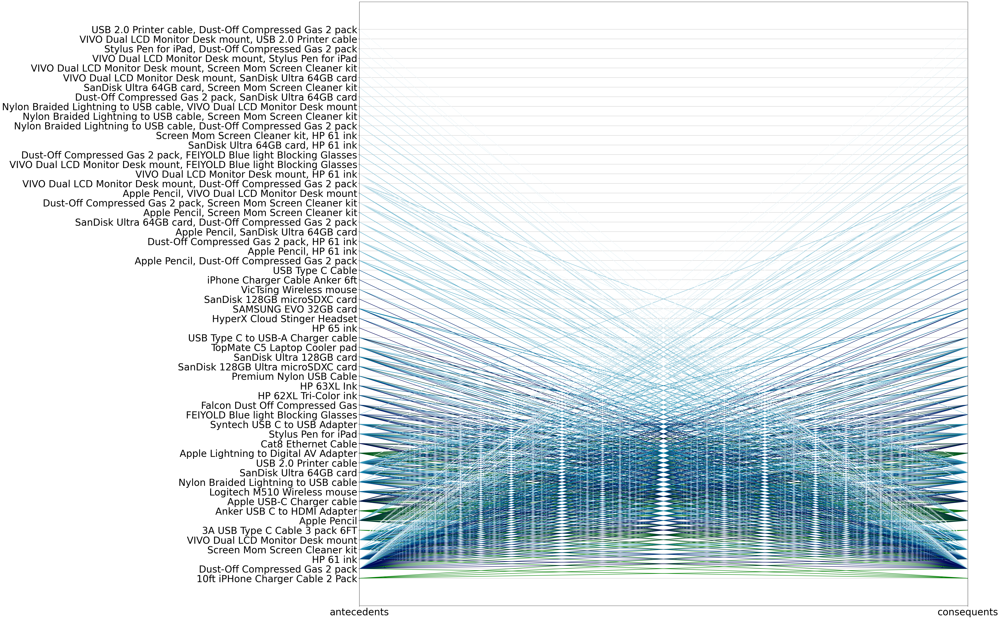

In [13]:
#parallell coordinate plot
from pandas.plotting import parallel_coordinates
rules['rule'] = rules.index
coordinates = rules[['antecedents', 'consequents', 'rule']]


plt.figure(figsize=(40,40))
parallel_coordinates(coordinates, 'rule', colormap='ocean')
plt.tick_params(axis='both', which='major', labelsize=35)
plt.legend().remove()

### Heatmap

For another method to provide a clear and intuitive way to identify intensity of relationships between items and itemsets in transactional datasets, heatmaps can be used. it help identify and filter interesting and actionable itemsets based on their support values.

The heatmap displays antecedents on the x-axis and consequents on the y-axis, with the intensity of the colors representing the support values. Lighter colors represent higher support values, while darker colors represent lower support values.

<AxesSubplot: xlabel='antecedents', ylabel='consequents'>

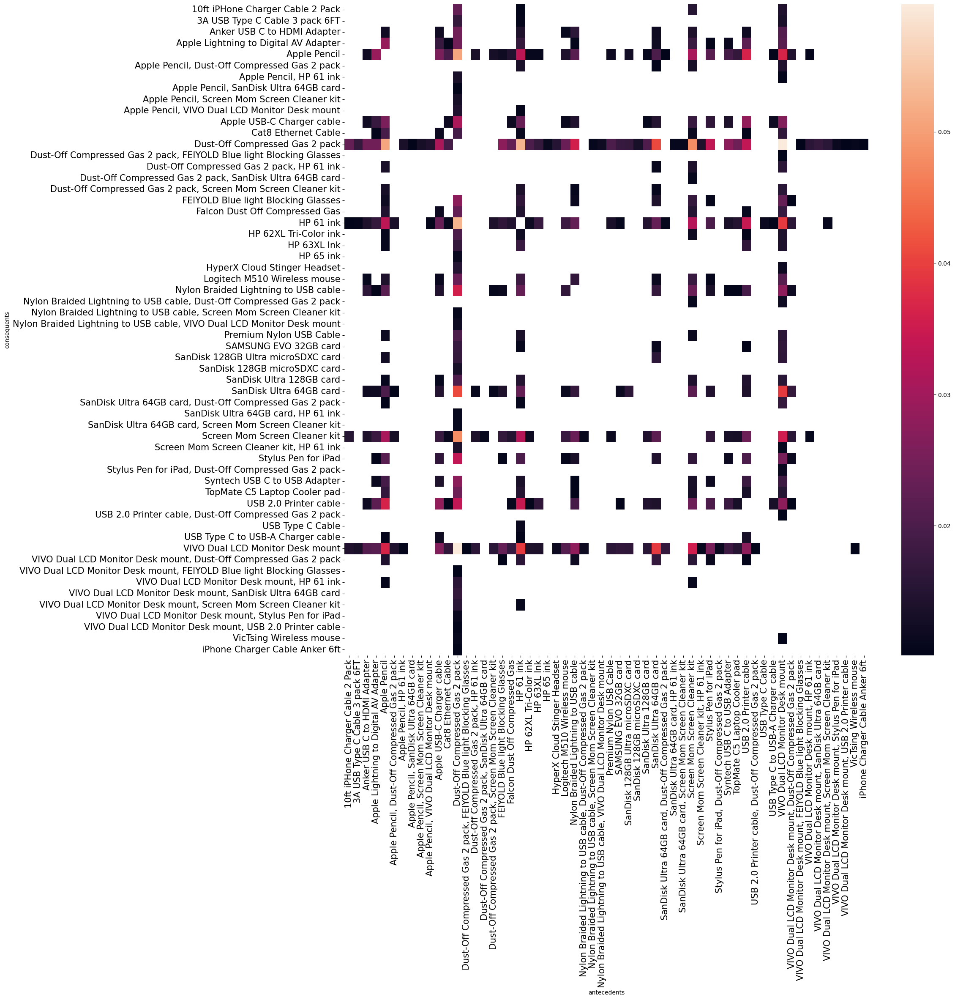

In [14]:
#parallell coordinate plot#heatmap
support_heatmap = rules.pivot(index='consequents', columns='antecedents', values='support')
plt.figure(figsize=(20,20))
plt.tick_params(axis='both', which='major', labelsize=15)
sns.heatmap(support_heatmap)

In [15]:
#scatter plot support and confidence
#sns.scatterplot(x='support', y='confidence', size='lift',hue='lift',data=rules)
#plt.xlim(0,0.3)
#plt.ylim(0,0.3)

**Implications**
- Our analysis of the parallel coordinates graph and heatmap suggests that the "Dust-off compressed gas 2 packs" item is the most frequently associated item with other products. This is indicated by the highly clustered lines in the parallel coordinate graph and the high support value in the heatmap, indicating a strong association between this item and others.

### Finding a significant rules

Once insights have been gained from the visualization, we can then begin to prune out the non-significant rules and identify the itemset rules that could be useful for a particular business purpose.

To select the most significant itemsets, we need to set the threshold for each metric. In this case, we will consider itemsets that meet the following criteria
- Support value must be higher or equal to 0.01
- Confidence must be higher or equal to 0.5
- Conviction must be higher than 1
- We order the rules based on the highest support and confidence values to strike a balance between the frequency of itemsets and the degree of association between them.

By applying these thresholds, we can filter out non-significant rules and focus on the itemset rules that are more actionable for our business.

In [29]:
pruned = rules[(rules['support'] >= 0.01) & (rules['confidence'] >= 0.4) & (rules['conviction'] >= 1)].sort_values(['support', 'confidence'], ascending = False)
pruned

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
166,SanDisk Ultra 64GB card,Dust-Off Compressed Gas 2 pack,0.098254,0.238368,0.040928,0.416554,1.747522,0.017507,1.305401,166
139,FEIYOLD Blue light Blocking Glasses,Dust-Off Compressed Gas 2 pack,0.065858,0.238368,0.027596,0.419028,1.757904,0.011898,1.310962,139
0,10ft iPHone Charger Cable 2 Pack,Dust-Off Compressed Gas 2 pack,0.050527,0.238368,0.023064,0.456464,1.914955,0.011020,1.401255,0
402,"VIVO Dual LCD Monitor Desk mount, SanDisk Ultr...",Dust-Off Compressed Gas 2 pack,0.039195,0.238368,0.017064,0.435374,1.826477,0.007722,1.348914,402
404,"SanDisk Ultra 64GB card, Dust-Off Compressed G...",VIVO Dual LCD Monitor Desk mount,0.040928,0.174110,0.017064,0.416938,2.394681,0.009938,1.416470,404
9,3A USB Type C Cable 3 pack 6FT,Dust-Off Compressed Gas 2 pack,0.042528,0.238368,0.017064,0.401254,1.683336,0.006927,1.272045,9
379,"VIVO Dual LCD Monitor Desk mount, HP 61 ink",Dust-Off Compressed Gas 2 pack,0.039195,0.238368,0.015865,0.404762,1.698053,0.006522,1.279541,379
409,"VIVO Dual LCD Monitor Desk mount, Screen Mom S...",Dust-Off Compressed Gas 2 pack,0.035462,0.238368,0.015731,0.443609,1.861024,0.007278,1.368879,409
374,"Screen Mom Screen Cleaner kit, HP 61 ink",Dust-Off Compressed Gas 2 pack,0.032129,0.238368,0.013998,0.435685,1.827780,0.006340,1.349656,374
331,"Apple Pencil, HP 61 ink",Dust-Off Compressed Gas 2 pack,0.033196,0.238368,0.013465,0.405622,1.701663,0.005552,1.281394,331


Implications
- Dust-Off Compressed Gas 2 pack appears to be the prominent item in our dataset. It is the consequent item in the majority of the statistically significant rules
- Combined with other findings, it indicates that the Dust-Off Compressed Gas 2 pack is highly associated with other items, and customers tend to purchase it along with other items.

## Interpreting the significant rule by each metrics

In [30]:
pruned.head(1)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,rule
166,SanDisk Ultra 64GB card,Dust-Off Compressed Gas 2 pack,0.098254,0.238368,0.040928,0.416554,1.747522,0.017507,1.305401,166


## **To gain a better understanding, let's take one of the rules and explain each metric.**

**Support:** "SanDisk Ultra 64GB card" and "Dust-Off Compressed Gas 2 pack" occur together with a frequency of 0.0409278763 (or 4.1%).

**Confidence:** The confidence value of 0.4165535957 indicates that when  "SanDisk Ultra 64GB card" occurs, there is a 41.66% probability that "Dust-Off Compressed Gas 2 pack" will also occur.

**Lift:** The lift value of 1.7475215442 indicates that "Dust-Off Compressed Gas 2 pack" is 1.748 times more likely to occur when  "SanDisk Ultra 64GB card" also occurs, compared to what would be expected by chance.

**Conviction:** The conviction value of 1.3054014503 indicates that if "SanDisk Ultra 64GB card" does not occur, there is a 1.31 times higher risk that "Dust-Off Compressed Gas 2 pack" will not occur as well.

**leverage:**  the occurrence of "SanDisk Ultra 64GB card" and "Dust-Off Compressed Gas 2 pack" together is 0.0175073488 more frequent than would be expected if they were independent of each other

**Remarks:** The filtered rules may vary depending on the chosen metric thresholds and the specific business purposes. Different threshold values may yield different sets of rules, and it is crucial for businesses to carefully consider and evaluate these rules before making any decisions.

## **Hypothetical Business Strategies**
- This insight can be leveraged by the management team to drive sales by **bundling the Dust-Off Compressed Gas 2 pack with other items**, placing it in high-traffic areas of the store, and creating targeted promotions to encourage its purchase.
- Retailers can leverage this insight to create targeted promotions or product placement strategies that encourage customers to purchase both the Dust-Off Compressed Gas 2 pack and the other items together. Additionally, retailers may consider adding these complementary items to the product bundle to create a more attractive offering for customers.